# IMPORTS

In [45]:
from IPython.display import display, Image
from collections import defaultdict
from pathlib import Path
from tqdm import tqdm
import cv2
import json
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns

CONFIG

In [46]:
# === CONFIG === ## Paths & File Extensions
CSV_PATH = "pasadena.csv"
BASE_DIR = "chips"
IMAGE_EXT = ".tiff"  # or ".png"
VERSION = 1.0

# Labels
L1 = "256"
L2 = "512"
L3 = "30cm"
L4 = "60cm"
L5 = "RGB"
L6 = "RGBN"
L7 = "GT"
L8 = "CV"

# Directory Names
IMAGE_DIR_BASENAME_1 = f"pasadena_256_60cm_RGB_GT"
# IMAGE_DIR_BASENAME_1 = f"pasadena_256_60cm_RGB_GT_WK10"
IMAGE_DIR_BASENAME_2 = f"pasadena_{L1}_{L4}_{L5}_{L7}_{L8}{VERSION}"

# I/O Paths
IMAGE_DIR_1 = os.path.join(BASE_DIR, IMAGE_DIR_BASENAME_1)
IMAGE_DIR_2 = os.path.join(BASE_DIR, IMAGE_DIR_BASENAME_2)
os.makedirs(IMAGE_DIR_2, exist_ok=True)

# Predefined Test image(s)
IMAGE_NUM = 0   # IMAGE IDX IS USED IN THE FILENAME AND IS AN INT ON LINESPACE 0 - LEN(DATA) - 1, 0 is safe , try others
TEST_IMAGE_1 = os.path.join(IMAGE_DIR_1, f"image_{IMAGE_NUM:04d}{IMAGE_EXT}")
TEST_IMAGE_2 = os.path.join(IMAGE_DIR_2, f"image_{IMAGE_NUM:04d}{IMAGE_EXT}")
print(IMAGE_DIR_1)
print(IMAGE_DIR_2)
print(TEST_IMAGE_1)
print(TEST_IMAGE_2)


TEST_STOP = 100  # this is a loop stop condition used for testing throughput

chips\pasadena_256_60cm_RGB_GT
chips\pasadena_256_60cm_RGB_GT_CV1.0
chips\pasadena_256_60cm_RGB_GT\image_0000.tiff
chips\pasadena_256_60cm_RGB_GT_CV1.0\image_0000.tiff


# TASK SPECIFIC METRICS

In [47]:
# ============================
# CELL 1 of 3 – Metric Prep
# ============================


# === GLOBALS ===
METRIC_STACK = defaultdict(dict)
FAILED_FILES = []

# MY_IMAGE_DIR = ""
# === CONFIGURATION ===
MY_IMAGE_DIR = my_image_dir if 'my_image_dir' in globals() else IMAGE_DIR_1

# === METRIC FUNCTIONS ===
def compute_brightness(image):
    """Compute average brightness (luminance) of an image."""
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    return np.mean(gray)

def compute_contrast(image):
    return image.std()

def compute_sharpness(image):
    sobel_vals = []
    for c in range(3):
        sobel = cv2.Sobel(image[:, :, c], cv2.CV_64F, 1, 1, ksize=5)
        sobel_vals.append(np.mean(np.abs(sobel)))
    return np.mean(sobel_vals)

def compute_edge_density(image):
    edges = cv2.Canny(image, 100, 200)
    return np.sum(edges > 0) / edges.size

def compute_blob_count_and_centroid_offset(image):
    _, thresh = cv2.threshold(image, 60, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    count = len(contours)
    if count == 0:
        return 0, -1

    h, w = image.shape
    centers = [cv2.moments(cnt) for cnt in contours if cv2.moments(cnt)['m00'] != 0]
    centers = [(int(m['m10']/m['m00']), int(m['m01']/m['m00'])) for m in centers]
    avg_x = np.mean([c[0] for c in centers])
    avg_y = np.mean([c[1] for c in centers])
    offset = abs(avg_x - w/2) + abs(avg_y - h/2)
    offset /= (w + h) / 2
    return count, offset

# === METRIC EXTRACTION LOOP ===
# sample_size = 100
for filename in tqdm(sorted(os.listdir(MY_IMAGE_DIR)), desc="Computing metrics"):
    if not filename.endswith(IMAGE_EXT):
        continue
    path = os.path.join(MY_IMAGE_DIR, filename)
    try:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        img_s = cv2.imread(path, cv2.IMREAD_COLOR)
        if img is None:
            raise ValueError("Could not load image.")
        blob_count, centroid_offset = compute_blob_count_and_centroid_offset(img)
        METRIC_STACK[filename]["blob_count"] = blob_count
        METRIC_STACK[filename]["brightness"] = compute_brightness(cv2.imread(path, cv2.IMREAD_COLOR))
        METRIC_STACK[filename]["centroid_offset"] = centroid_offset
        METRIC_STACK[filename]["contrast"] = compute_contrast(img)
        METRIC_STACK[filename]["edge_density"] = compute_edge_density(img)
        METRIC_STACK[filename]["sharpness"] = compute_sharpness(img_s)

    except Exception as e:
        FAILED_FILES.append((filename, str(e)))

    TEST_STOP -=1 # COMMENT THIS LINE OUT WHEN NOT TESTING THROUGH PUT
    if TEST_STOP == 0: break # COMMENT THIS LINE OUT WHEN NOT TESTING THROUGH PUT
# === GLOBALIZATION ===
METRIC_STACK_DF = pd.DataFrame.from_dict(METRIC_STACK, orient="index")
globals()["METRIC_STACK_DF"] = METRIC_STACK_DF
# FAILED_IMAGE_LIST = [x[0] for x in FAILED_FILES] if FAILED_FILES else []

if not METRIC_STACK_DF.empty:
    METRIC_KEYS = [col for col in METRIC_STACK_DF.columns if col != "filename"]
    print(f"[SUCCESS] Metric stack populated. Metrics: {METRIC_KEYS}")
else:
    print("[FAILURE] Metric stack is empty. Please check source images.")

# Preview
METRIC_STACK_DF.head()

Computing metrics:   0%|          | 99/57070 [00:00<06:20, 149.61it/s]

[SUCCESS] Metric stack populated. Metrics: ['blob_count', 'brightness', 'centroid_offset', 'contrast', 'edge_density', 'sharpness']


,blob_count,brightness,centroid_offset,contrast,edge_density,sharpness
image_0000.tiff,6,92.117493,0.437500,33.403991,0.164062,116.533279
image_0001.tiff,9,90.889465,0.407552,32.763502,0.160706,115.728338
image_0002.tiff,17,90.672958,0.495536,33.098506,0.159698,114.995010
image_0003.tiff,17,90.236679,0.429688,33.358577,0.161804,118.027130
image_0004.tiff,16,90.615845,0.493652,33.661873,0.159225,117.057103


In [48]:
all_keys = set()
for entry in METRIC_STACK.values():
    all_keys.update(entry.keys())
print("Unique metric subkeys found:", all_keys)

Unique metric subkeys found: {'contrast', 'blob_count', 'edge_density', 'centroid_offset', 'brightness', 'sharpness'}


# VISUALIZE EXTREMES

In [49]:
def visualize_extreme_samples(
    image_dir,
    image_metrics,
    metric,
    n_samples=3,
    cmap=None,
    layout="portrait",  # "portrait" = stacked, "landscape" = side-by-side
    scale=6
):
    """
    Display two square grids of images: lowest and highest scoring samples by a given metric.
    layout: "portrait" = stacked grids, "landscape" = side-by-side grids
    """
    num_images = n_samples * n_samples

    # Filter and sort
    metric_items = [
        (k, v.get(metric, None))
        for k, v in image_metrics.items()
        if v.get(metric, None) is not None
    ]
    if len(metric_items) < num_images:
        print(f"⚠️ Only {len(metric_items)} valid entries found for metric '{metric}', but {num_images} needed.")
        return

    metric_items.sort(key=lambda x: x[1])
    low_samples = metric_items[:num_images]
    high_samples = metric_items[-num_images:]

    global LOW_SAMPLES, HIGH_SAMPLES  # Enable downstream export access
    LOW_SAMPLES = low_samples
    HIGH_SAMPLES = high_samples


    # Internal helper for plotting
    def plot_grid(samples, title):
        fig, axes = plt.subplots(n_samples, n_samples, figsize=(scale * n_samples, scale * n_samples))
        axes = axes if isinstance(axes, np.ndarray) else np.array([[axes]])
        axes = axes.reshape(-1)

        for ax, (fname, score) in zip(axes, samples):
            img_path = os.path.join(image_dir, fname)
            # img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            img = cv2.imread(img_path)#, cv2.IMREAD_GRAYSCALE)
            if img is not None:
                ax.imshow(img, cmap=cmap)
                ax.set_title(f"{fname}\n{metric}: {score:.2f}", fontsize=8)
            ax.axis("off")

        for ax in axes[len(samples):]:
            ax.axis("off")

        plt.suptitle(title, fontsize=12)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    # === Layout modes ===
    if layout == "portrait":
        plot_grid(low_samples, f"Lowest {metric} ({num_images} samples)")
        plot_grid(high_samples, f"Highest {metric} ({num_images} samples)")

    elif layout == "landscape":
        fig, axes = plt.subplots(
            nrows=n_samples,
            ncols=2 * n_samples,
            figsize=(scale * 2 * n_samples, scale * n_samples)
        )
        axes = axes.reshape(n_samples, 2 * n_samples)

        all_samples = [low_samples, high_samples]
        titles = ["Lowest", "Highest"]

        for col_offset, (sample_set, title_prefix) in enumerate(zip(all_samples, titles)):
            for i in range(n_samples):
                for j in range(n_samples):
                    idx = i * n_samples + j
                    ax = axes[i][j + col_offset * n_samples]
                    if idx < len(sample_set):
                        fname, score = sample_set[idx]
                        img_path = os.path.join(image_dir, fname)
                        # img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
                        if img is not None:
                            ax.imshow(img, cmap=cmap)
                            ax.set_title(f"{fname}\n{metric}: {score:.2f}", fontsize=6)
                    ax.axis("off")

        plt.suptitle(f"{titles[0]} and {titles[1]} {metric} ({num_images} samples each)", fontsize=12)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    else:
        raise ValueError("Invalid layout. Use 'portrait' or 'landscape'.")

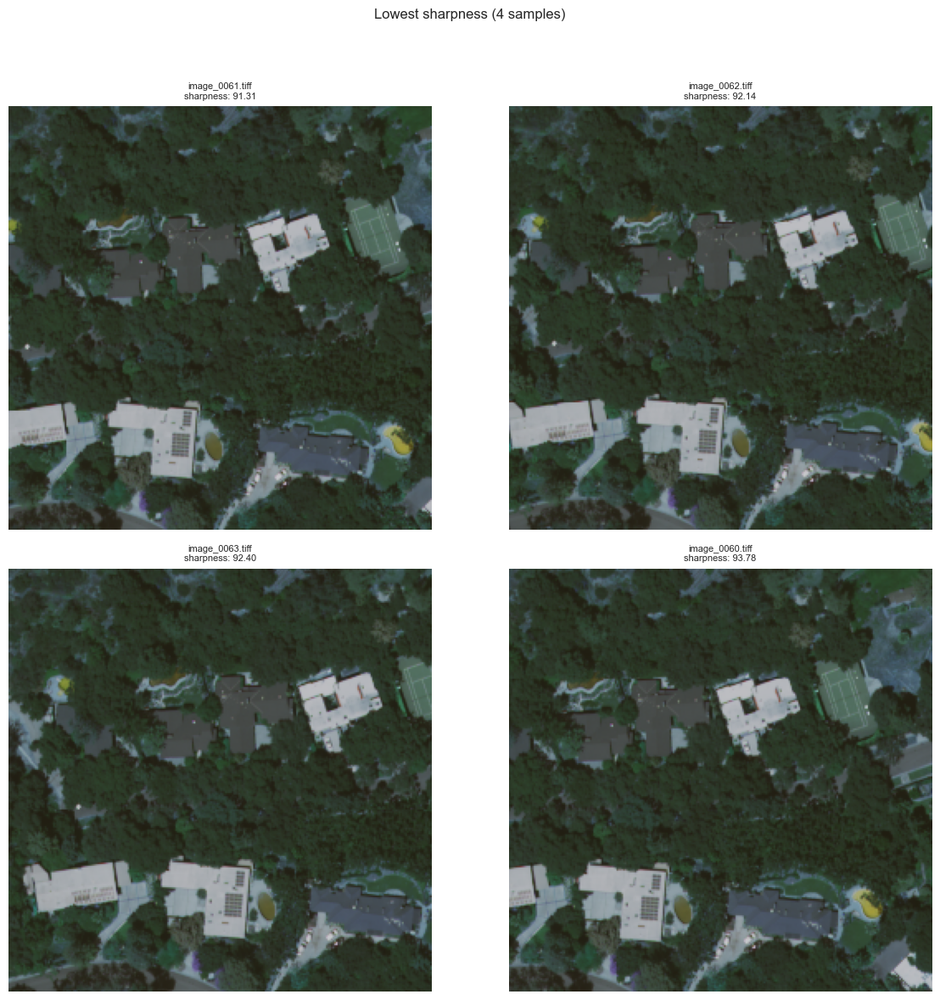

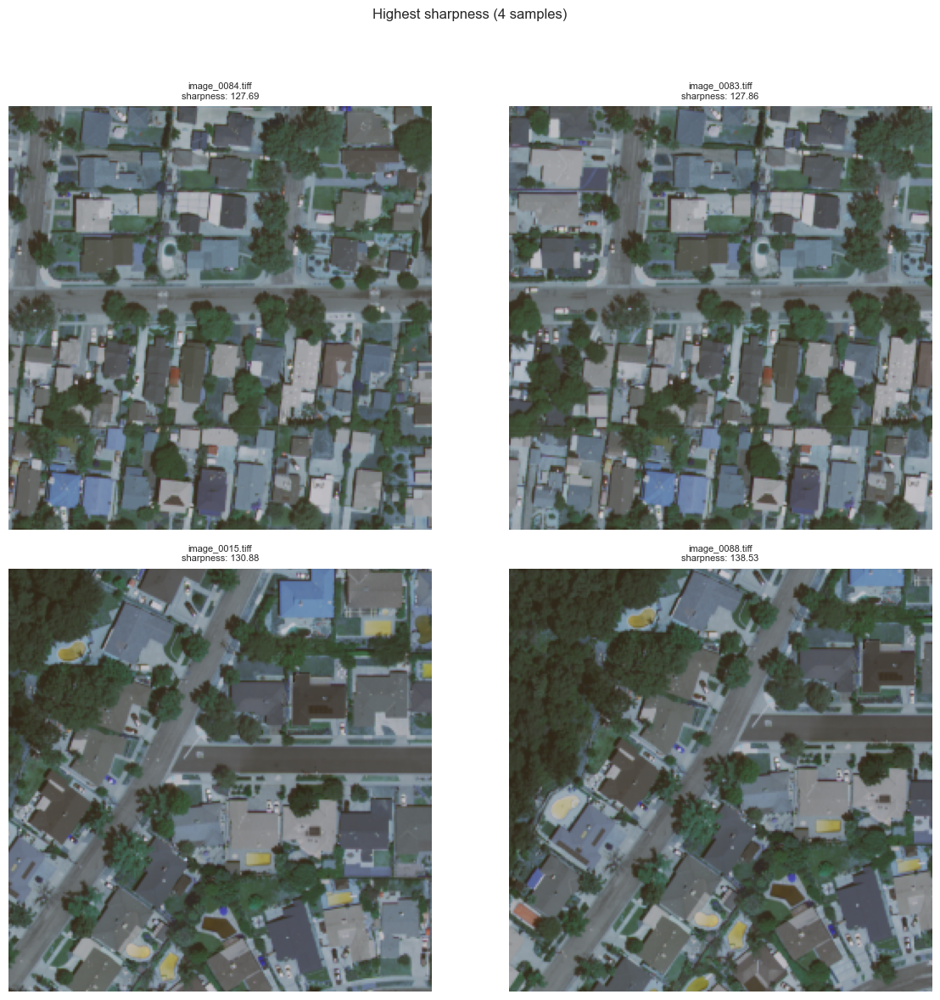

In [50]:
metric_to_plot = "sharpness"
n_grid = 2# Any integer from 2 to ??

# metric_stack={entry["filename"]: {k: v for k, v in entry.items() if k != "filename"} for entry in METRIC_STACK}  #Addapting to legacy code
metric_stack=[v["filename"] for v in METRIC_STACK.values() if "filename" in v]

visualize_extreme_samples(
    image_dir=MY_IMAGE_DIR,
    image_metrics=METRIC_STACK,
    metric=metric_to_plot,
    n_samples=n_grid,
    layout="portrait"
)

In [51]:
METRIC_STACK_DF["sharpness"].describe()

count    100.000000
mean     113.031251
std        8.905831
min       91.306183
25%      108.641190
50%      113.905680
75%      116.951341
max      138.529271
Name: sharpness, dtype: float64

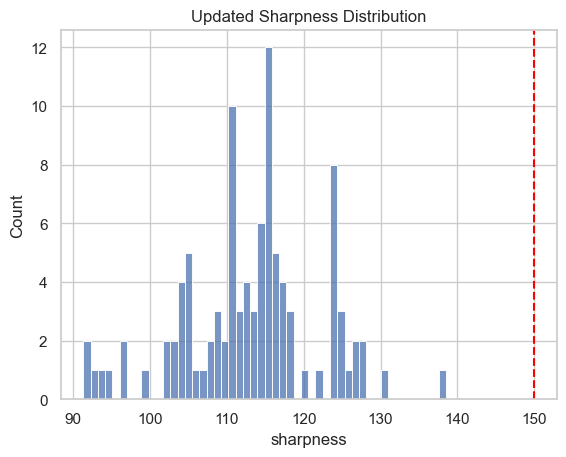

In [52]:
sns.histplot(METRIC_STACK_DF["sharpness"], bins=50)
SHARPNESS_THRESHOLD = 150
plt.axvline(SHARPNESS_THRESHOLD, color="red", linestyle="--")
plt.title("Updated Sharpness Distribution")
plt.show()

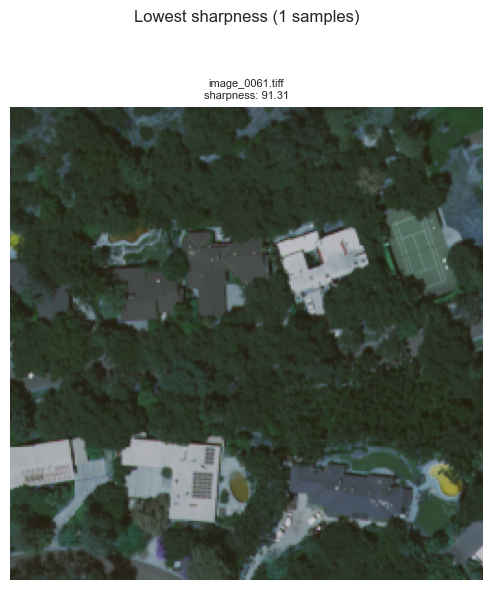

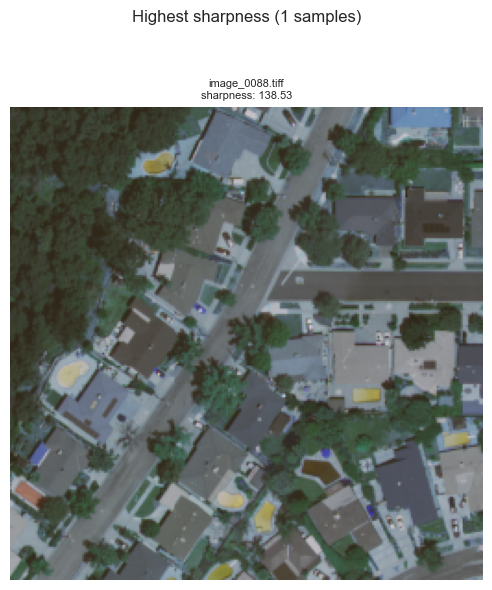

In [53]:
metric_to_plot = "sharpness"
n_grid = 1  # Any integer from 2 to ??

# metric_stack={entry["filename"]: {k: v for k, v in entry.items() if k != "filename"} for entry in METRIC_STACK}  #Addapting to legacy code
metric_stack=[v["filename"] for v in METRIC_STACK.values() if "filename" in v]

visualize_extreme_samples(
    image_dir=MY_IMAGE_DIR,
    image_metrics=METRIC_STACK,
    metric=metric_to_plot,
    n_samples=n_grid,
    layout="portrait"
)

# EXPORT

In [54]:
# EXPORT: METRIC STACK TO DISK (JSON)
def export_metric_stack_to_json(output_dir="exports", filename_prefix="metric_stack_export"):
    """
    Exports the global METRIC_STACK to a JSON file in the specified directory.

    Args:
        output_dir (str): Directory to save the exported JSON file.
        filename_prefix (str): Prefix for the filename. A timestamp will be appended.

    Returns:
        str: Path to the saved JSON file.
    """
    import os
    import json
    from datetime import datetime
    import pandas as pd

    os.makedirs(output_dir, exist_ok=True)

    # === Resiliency Stub ===
    if not METRIC_STACK:
        print("[SKIPPED] ❌ METRIC_STACK is empty. Nothing to export.")
        return None

    # === Timestamp and filename ===
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"{filename_prefix}_{timestamp}.json"
    output_path = os.path.join(output_dir, filename)

    # === Export to JSON with type casting and resilience ===
    bad_entries = [k for k, v in METRIC_STACK.items() if not isinstance(v, dict)]
    if bad_entries:
        print(f"[WARN] Skipped {len(bad_entries)} malformed entries: {bad_entries[:5]}...")

    with open(output_path, "w") as f:
        json.dump(
            {
                k: {mk: float(mv) for mk, mv in v.items()}
                for k, v in METRIC_STACK.items()
                if isinstance(v, dict)
            },
            f,
            indent=2
        )

    # Optional: export also to CSV
    df_export = pd.DataFrame.from_dict(METRIC_STACK, orient="index")
    df_export.to_csv(os.path.join(output_dir, f"{filename_prefix}_{timestamp}.csv"))

    print(f"✅ Metric stack exported to: {output_path}")
    return output_path

json_path = export_metric_stack_to_json()

✅ Metric stack exported to: exports\metric_stack_export_20250730_175357.json


 VALIDATE EXPORT:

This section verifies the integrity and usability of the exported JSON file.

1. **Confirm File Existence**
   Ensure the `.json` file was created and is present in the target directory.

2. **Open and Load File**
   Load the contents using `json.load()` and validate structural correctness.

3. **Check for Required Keys**
   Confirm that `"low_samples"` and `"high_samples"` exist and contain the correct number of entries.

4. **Preview Data Sample**
   Print a few representative entries to verify content formatting and readiness for downstream use.
VALIDATE EXPORT

In [55]:
# 1. Confirm File Existence
# 2. Open and Load File
with open(json_path, "r") as f:
    loaded = json.load(f)
    print(f"✅ JSON loaded successfully. Keys: {list(loaded.keys())[:3]}")

✅ JSON loaded successfully. Keys: ['image_0000.tiff', 'image_0001.tiff', 'image_0002.tiff']


In [56]:
assert loaded == METRIC_STACK, "❌ Exported JSON differs from original METRIC_STACK!"
print("✅ Round-trip test passed: JSON contents match the original.")

✅ Round-trip test passed: JSON contents match the original.


In [57]:
# 3 heck for Required Keys
metric_name = list(loaded.keys())[0]
sample = list(loaded[metric_name].items())[0]
print(f"Sample from metric '{metric_name}': {sample}")

Sample from metric 'image_0000.tiff': ('blob_count', 6.0)


In [58]:
# 3. Check for Required Keys
for metric, values in loaded.items():
    assert isinstance(values, dict), f"❌ Metric '{metric}' is not a dictionary"
    for fname, score in values.items():
        assert isinstance(fname, str), "❌ Filename key is not a string"
        assert isinstance(score, (int, float)), "❌ Score is not a number"
print("✅ Structural validation passed.")

✅ Structural validation passed.


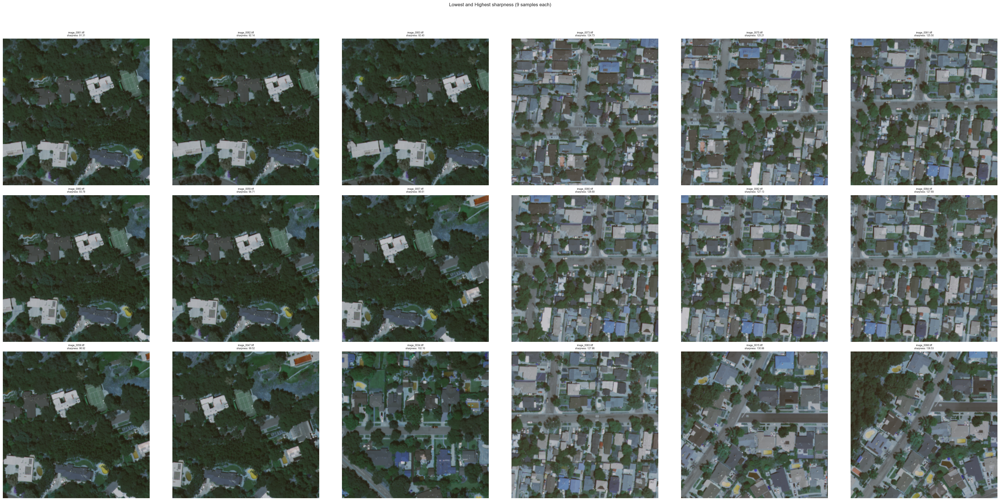

In [59]:
# 4. Preview Data Sample
visualize_extreme_samples(MY_IMAGE_DIR, loaded, metric=metric_to_plot, n_samples=3, layout="landscape")

# SLICE

This section filters and explores the computed image metrics stored in `METRIC_STACK_DF`.
The goal is to create **task-informed views** of the data — such as identifying the lowest-contrast or blurriest chips — to inform downstream quality filtering decisions.

It serves as the final diagnostic checkpoint before hard masking begins in the consumer pipeline.


In [60]:
# === SLICE: Create unified view of all images with ANY low metric ===

# Parameters
PERCENTILE_CUTOFF = 5  # Adjustable if needed
required_metrics = ["brightness", "centroid_offset", "edge_density", "contrast", "sharpness", "blob_count"]

# Confirm metric stack available
if "METRIC_STACK_DF" not in globals():
    raise ValueError("METRIC_STACK_DF is missing. Ensure upstream metric generation ran successfully.")

# Compute per-metric thresholds
thresholds = {
    metric: METRIC_STACK_DF[metric].quantile(PERCENTILE_CUTOFF / 100)
    for metric in required_metrics
}

# Build mask: include any row that is low in at least one metric
is_low = np.zeros(len(METRIC_STACK_DF), dtype=bool)
for metric in required_metrics:
    is_low |= METRIC_STACK_DF[metric] <= thresholds[metric]

# Apply mask
low_metrics_df = METRIC_STACK_DF[is_low].copy()

# Show summary
expected_size = int(len(METRIC_STACK_DF) * PERCENTILE_CUTOFF / 100)
print(f"🎯 Target slice size: {expected_size}")
print(f"📉 Actual size of low_metrics_df: {len(low_metrics_df)}")

# Optional preview
print("📌 Preview contents of low_metrics_df:")
display(low_metrics_df.head())

# Capture filenames for downstream use
sample_img_names = list(low_metrics_df.index)
print(f"📸 {len(sample_img_names)} image names loaded: {sample_img_names[:5]}...")

# Promote to global
globals()["low_metrics_df"] = low_metrics_df
globals()["sample_img_names"] = sample_img_names


🎯 Target slice size: 5
📉 Actual size of low_metrics_df: 21
📌 Preview contents of low_metrics_df:


,blob_count,brightness,centroid_offset,contrast,edge_density,sharpness
image_0034.tiff,182,71.669601,0.043791,29.396398,0.118973,102.097773
image_0046.tiff,343,63.158707,0.076202,29.064608,0.092148,103.219208
image_0059.tiff,238,64.519363,0.027192,33.294724,0.081451,94.714620
image_0060.tiff,253,64.924698,0.038883,33.984828,0.079239,93.775915
image_0061.tiff,271,64.379883,0.026970,33.720929,0.074173,91.306183


📸 21 image names loaded: ['image_0034.tiff', 'image_0046.tiff', 'image_0059.tiff', 'image_0060.tiff', 'image_0061.tiff']...


In [61]:
# 1. Guard: Ensure low_metrics_df is defined and not empty (resilience protocol)
if 'low_metrics_df' not in globals() or low_metrics_df.empty:
    raise ValueError("low_metrics_df is missing or empty. Ensure SLICE Cell 1 ran successfully.")

# 2. Confirm expected size
expected_size = int(len(METRIC_STACK_DF) * PERCENTILE_CUTOFF / 100)
print(f"✅ Target slice size: {expected_size}")
print(f"📊 Actual size of low_metrics_df: {len(low_metrics_df)}")

# 3. Confirm content preview
print("📋 Preview contents of low_metrics_df:")
print(low_metrics_df.head())

# 4. Capture image names used
sample_img_names = list(low_metrics_df.index)
print(f"🖼️ {len(sample_img_names)} image names loaded: {sample_img_names[:5]}...")

✅ Target slice size: 5
📊 Actual size of low_metrics_df: 21
📋 Preview contents of low_metrics_df:
                 blob_count  brightness  centroid_offset   contrast  \
image_0034.tiff         182   71.669601         0.043791  29.396398   
image_0046.tiff         343   63.158707         0.076202  29.064608   
image_0059.tiff         238   64.519363         0.027192  33.294724   
image_0060.tiff         253   64.924698         0.038883  33.984828   
image_0061.tiff         271   64.379883         0.026970  33.720929   

                 edge_density   sharpness  
image_0034.tiff      0.118973  102.097773  
image_0046.tiff      0.092148  103.219208  
image_0059.tiff      0.081451   94.714620  
image_0060.tiff      0.079239   93.775915  
image_0061.tiff      0.074173   91.306183  
🖼️ 21 image names loaded: ['image_0034.tiff', 'image_0046.tiff', 'image_0059.tiff', 'image_0060.tiff', 'image_0061.tiff']...


# VISUALIZE SLICE
This sub-section of SLICE provides **visual confirmation** of the lowest-performing image chips in each core metric (contrast, sharpness, edge density). It uses grid-based sampling to surface potential image quality issues and support manual threshold calibration.

#### 🔍 Purpose:
- Spot-check image chips in the **bottom percentile** of each metric.
- Enable fast visual debugging of metric behavior.
- Help calibrate filter thresholds in downstream sections.

#### 🧩 Features:
- Accepts `n_grid` to generate square image grids (e.g., 3×3, 4×4).
- Automatically sorts by the metric of interest (lowest first).
- Can be reused per-metric (`low_metrics_df`, `low_sharpness_df`, `low_edge_density_df`).

#### 🧪 Outcome:
- Reveals weak spots in the dataset before filters are applied.
- Helps tune metric cutoffs based on actual visual quality.


In [62]:
def visualize_slice_samples(metric_df, metric_label, image_dir, n_grid=3):
    """
    Display a square grid of sample images from a filtered metric DataFrame

    Parameters:
    - df: low_metrics_df (with image filenames as index, metric values in column)
    - metric_label: name of the metric (e.g., 'contrast')
    - image_dir: path to image directory
    - n_grid: size of grid (e.g., 2 for 2x2, 3 for 3x3)

    Returns:
    - None (displays plot only)
    """

    # === Safeguard: Guard against bad input ===
    if metric_df is None or metric_df.empty:
        print(f"⚠️ Cannot visualize {metric_label}: DataFrame is empty or missing.")
        return

    # === Setup slice ===
    n_samples = n_grid * n_grid
    df_sorted = metric_df.sort_values(by=metric_label)
    selected_df = df_sorted.head(n_samples)

    image_names = list(selected_df.index)
    metric_scores = selected_df[metric_label].tolist()

    # === GLOBAL SELECT for downstream QA ===
    if 'GLOBAL_SELECTORS' not in globals():
        GLOBAL_SELECTORS = {}

    # === GLOBAL SELECT for downstream QA ===
    GLOBAL_SELECTORS[f"low_{metric_label}_sampled"] = image_names

    # === Plot ===
    scaling_factor = 5
    fig, axes = plt.subplots(n_grid, n_grid, figsize=(scaling_factor * n_grid,scaling_factor * n_grid))
    axes = axes.flatten()

    for ax, img_name, score in zip(axes, image_names, metric_scores):
        img_path = os.path.join(image_dir, img_name)
        try:
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img is None:
                raise ValueError("cv2.imread returned None")
            ax.imshow(img, cmap="gray")
            ax.set_title(f"{img_name}\n{metric_label}: {score:.2f}", fontsize=8)
        except Exception:
            ax.imshow(np.ones((224, 224)), cmap="gray")
            ax.set_title(f"{img_name}\n[Missing]", fontsize=8, color='red')

        ax.axis("off")

    for ax in axes[len(image_names):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

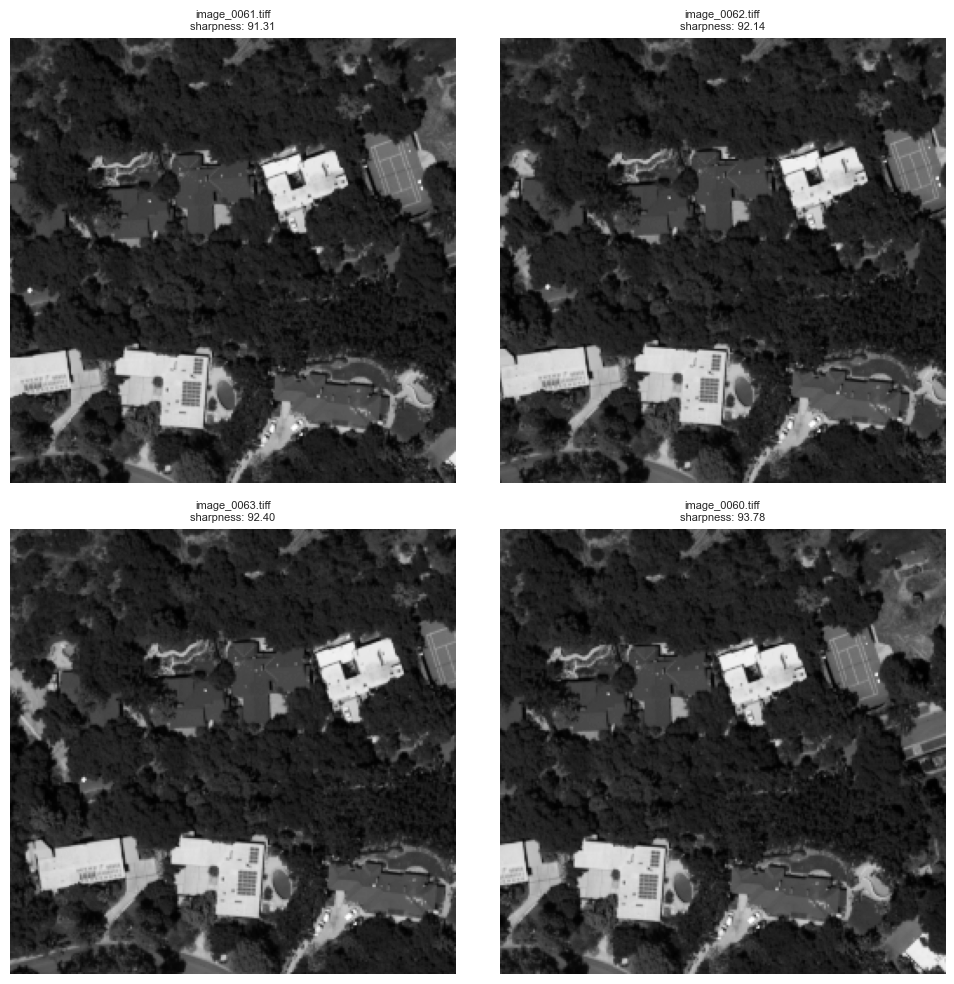

In [63]:
visualize_slice_samples(
    metric_df=low_metrics_df,
    # metric_label="centroid_offset",
    metric_label="sharpness",
    image_dir=MY_IMAGE_DIR,
    n_grid=2,
)

# TIER FILTER: Threshold-Based Filtering and Viable Chip Selection

This section applies **metric-based filters** to identify image chips suitable for downstream modeling. Each chip is evaluated on contrast, sharpness, and edge density using calibrated thresholds.

#### 🔍 Purpose:
- Exclude low-quality image chips based on objective metric values.
- Flag each chip with a clear **pass/fail status** and reason.
- Prepare structured data for inspection, logging, and export.

#### 🧪 Logic:
- Chips below thresh


In [64]:
# === TIER FILTER: APPLY TIER LOGIC TO METRIC STACK ===PRE CV
# Assigns each image a quality tier based on 5 critical metric thresholds

# Thresholds calibrated for object detection readiness
BLOB_COUNT_THRESHOLD = 10
BRIGHTNESS_THRESHOLD = 80
CENTROID_OFFSET_THRESHOLD = 0.35
CONTRAST_THRESHOLD = 30
EDGE_DENSITY_THRESHOLD = 0.10
SHARPNESS_THRESHOLD = 60

In [65]:

df = METRIC_STACK_DF.copy()

# Flag each chip on 5+ critical metrics
df["flag_low_blob_count"] = df["blob_count"] < BLOB_COUNT_THRESHOLD
df["flag_low_brightness"] = df["brightness"] < BRIGHTNESS_THRESHOLD
df["flag_low_centroid_offset"] = df["centroid_offset"] < CENTROID_OFFSET_THRESHOLD
df["flag_low_contrast"] = df["contrast"] < CONTRAST_THRESHOLD
df["flag_low_edge_density"] = df["edge_density"] < EDGE_DENSITY_THRESHOLD
df["flag_low_sharpness"] = df["sharpness"] < SHARPNESS_THRESHOLD

# Combine tier with failure reasons
def compute_reason(row):
    reasons = []
    if row["flag_low_blob_count"]:
        reasons.append("low_blob_count")
    if row["flag_low_brightness"]:
        reasons.append("low_brightness")
    if row["flag_low_centroid_offset"]:
        reasons.append("low_centroid_offset")
    if row["flag_low_contrast"]:
        reasons.append("low_contrast")
    if row["flag_low_edge_density"]:
        reasons.append("low_edge_density")
    if row["flag_low_sharpness"]:
        reasons.append("low_sharpness")

    if not reasons:
        tier = "pass"
    elif len(reasons) <= 2:
        tier = "weak"
    else:
        tier = "fail"

    return {"tier": tier, "reasons": reasons}

df["reason"] = df.apply(compute_reason, axis=1)
df["quality_tier"] = df["reason"].apply(lambda x: x["tier"])

# Promote to global
tiered_df = pd.DataFrame()  # placeholder for IDE linting
globals()["tiered_df"] = df


In [66]:
# === FILTER LOGIC: MULTI-METRIC AWARE ===

# Thresholds (update if needed)
CONTRAST_THRESH = METRIC_STACK_DF["contrast"].quantile(0.05)
SHARPNESS_THRESH = METRIC_STACK_DF["sharpness"].quantile(0.05)
EDGE_DENSITY_THRESH = METRIC_STACK_DF["edge_density"].quantile(0.05)
BRIGHTNESS_THRESH = METRIC_STACK_DF["brightness"].quantile(0.05)

def apply_filter_reason(row):
    """Evaluate all metrics and return quality tier and failure reasons."""
    fail_reasons = []

    if row["contrast"] < CONTRAST_THRESH:
        fail_reasons.append("contrast")
    if row["sharpness"] < SHARPNESS_THRESH:
        fail_reasons.append("sharpness")
    if row["edge_density"] < EDGE_DENSITY_THRESH:
        fail_reasons.append("edge_density")
    if row["brightness"] < BRIGHTNESS_THRESH:
        fail_reasons.append("brightness")

    if not fail_reasons:
        tier = "pass"
    elif len(fail_reasons) == 1:
        tier = "weak"
    else:
        tier = "fail"

    return {
        "tier": tier,
        "reasons": fail_reasons
    }

# Apply filter logic to a copy of the metric stack
try:
    FILTERED_METRICS_DF = METRIC_STACK_DF.copy()
    FILTERED_METRICS_DF["reason"] = FILTERED_METRICS_DF.apply(apply_filter_reason, axis=1)
    reason_summary = FILTERED_METRICS_DF["reason"].value_counts()
    print("[TIER_FILTER 2] ✅ Reason tagging complete.\n", reason_summary)

    # Optional: Promote for downstream use
    globals()["FILTERED_METRICS_DF"] = FILTERED_METRICS_DF

except Exception as e:
    print(f"[TIER_FILTER 2] ❌ Error during reason tagging: {e}")


[TIER_FILTER 2] ✅ Reason tagging complete.
 reason
{'tier': 'pass', 'reasons': []}                                             90
{'tier': 'weak', 'reasons': ['contrast']}                                    4
{'tier': 'fail', 'reasons': ['sharpness', 'edge_density', 'brightness']}     4
{'tier': 'fail', 'reasons': ['contrast', 'brightness']}                      1
{'tier': 'fail', 'reasons': ['sharpness', 'edge_density']}                   1
Name: count, dtype: int64


# SPOT CHECK FILTER - Visual Audit of Metric-Based Exclusions

This section provides a **visual inspection** of image chips that were flagged during filtering.

#### 🔍 Purpose:
- Visually verify that low-quality chips (e.g., “low_contrast”) were correctly excluded.
- Build intuition about what the met


In [67]:
# === TIER FILTER CELL 3: ASSERT BLOCK ===
try:
    assert all(METRIC_STACK_DF.loc[METRIC_STACK_DF["reason"] == "low_blob_count", "blob_count"] < BLOB_COUNT_THRESHOLD)
    assert all(METRIC_STACK_DF.loc[METRIC_STACK_DF["reason"] == "low_brightness", "brightness"] < BRIGHTNESS_THRESHOLD)
    assert all(METRIC_STACK_DF.loc[METRIC_STACK_DF["reason"] == "low_centroid_offset", "centroid_offset"] < CENTROID_OFFSET_THRESHOLD)
    assert all(METRIC_STACK_DF.loc[METRIC_STACK_DF["reason"] == "low_contrast", "contrast"] < CONTRAST_THRESHOLD)
    assert all(METRIC_STACK_DF.loc[METRIC_STACK_DF["reason"] == "low_edge_density", "edge_density"] < EDGE_DENSITY_THRESHOLD)
    assert all(METRIC_STACK_DF.loc[METRIC_STACK_DF["reason"] == "low_sharpness", "sharpness"] < SHARPNESS_THRESHOLD)

    metrics_pass = METRIC_STACK_DF.loc[METRIC_STACK_DF["reason"] == "pass",
        ["contrast", "sharpness", "edge_density", "centroid_offset", "blob_count", "brightness"]]
    assert all(metrics_pass["blob_count"] >= BLOB_COUNT_THRESHOLD)
    assert all(metrics_pass["brightness"] >= BRIGHTNESS_THRESHOLD)
    assert all(metrics_pass["centroid_offset"] >= CENTROID_OFFSET_THRESHOLD)
    assert all(metrics_pass["contrast"] >= CONTRAST_THRESHOLD)
    assert all(metrics_pass["edge_density"] >= EDGE_DENSITY_THRESHOLD)
    assert all(metrics_pass["sharpness"] >= SHARPNESS_THRESHOLD)

    print("✅ TIER FILTER 3 ✔ All assertions passed")
except Exception as e:
    print(f"❌ TIER FILTER 3 ✘ Assertion failed: {e}")

❌ TIER FILTER 3 ✘ Assertion failed: 'reason'


⚠️ Cannot visualize blob_count: DataFrame is empty or missing.


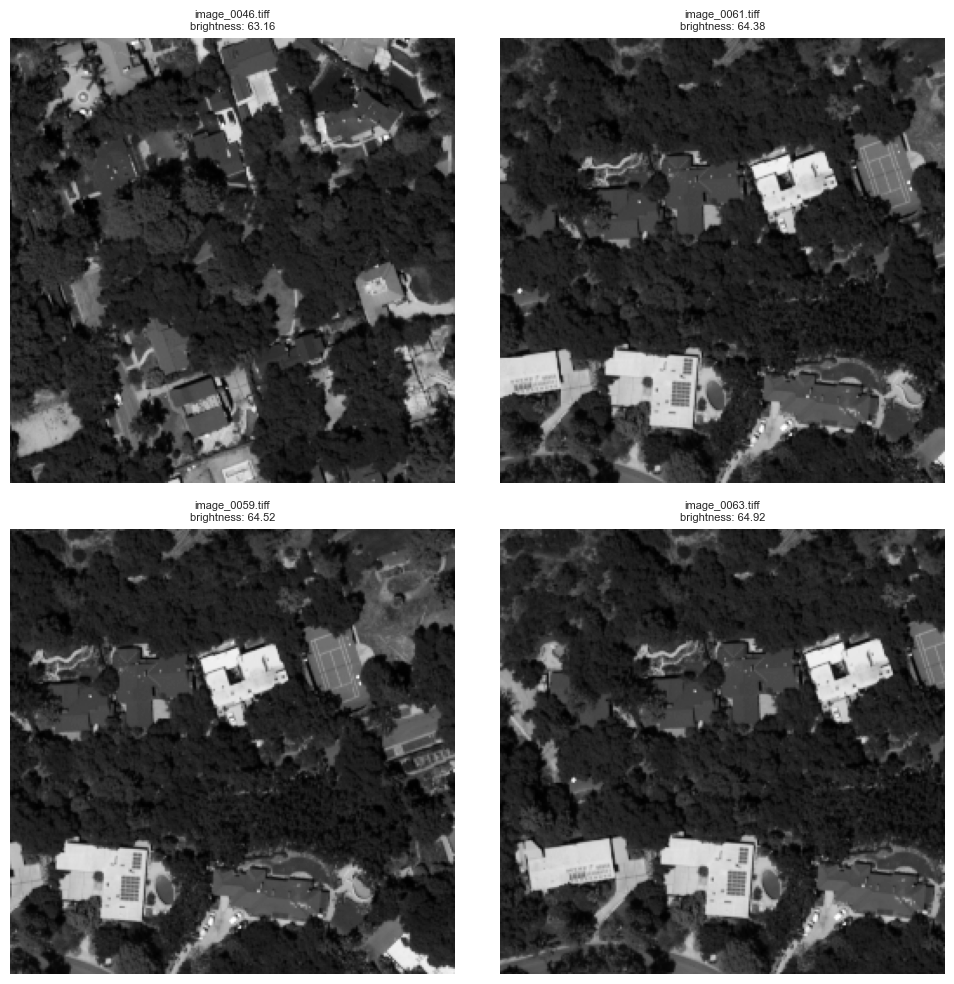

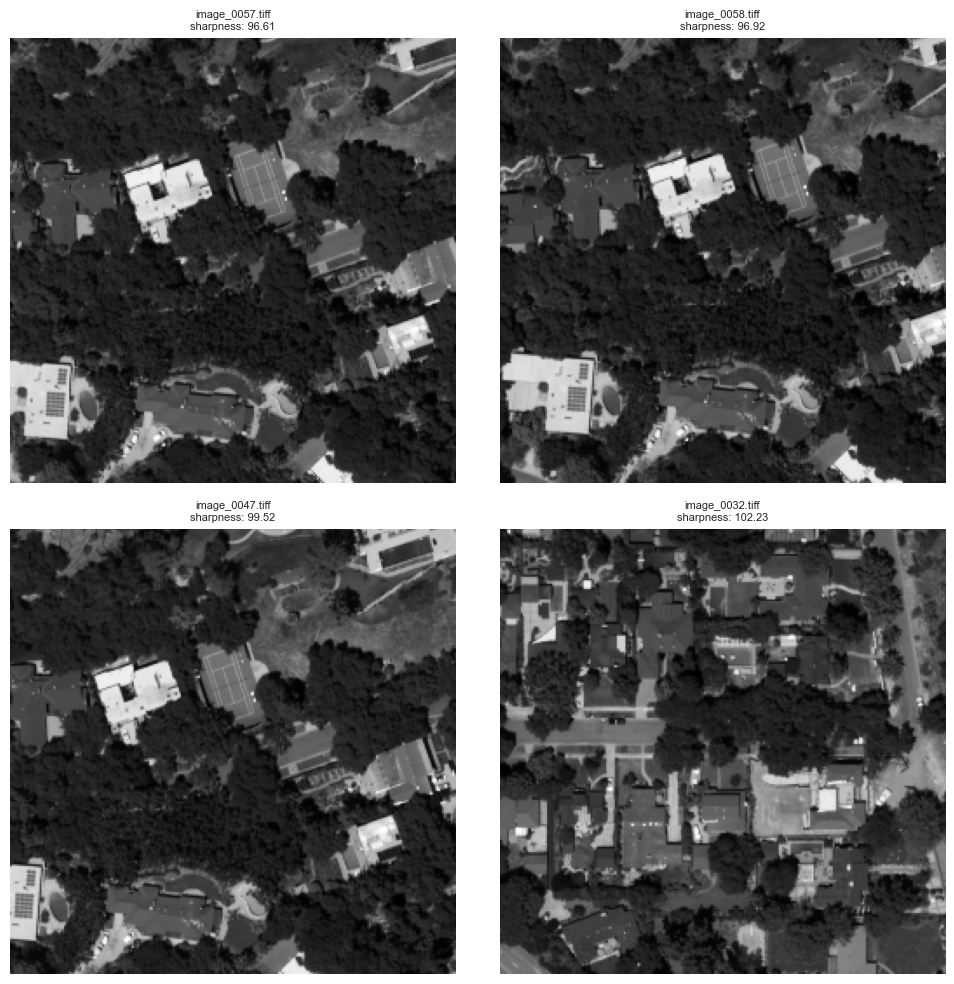

In [68]:
# Tier Filter Cell 4 (Fixed)
visualize_slice_samples(
    metric_df=FILTERED_METRICS_DF[
        FILTERED_METRICS_DF["reason"].apply(lambda x: "blob_count" in x.get("reasons", []))
    ],
    metric_label="blob_count",
    image_dir=MY_IMAGE_DIR,
    n_grid=2,
)

visualize_slice_samples(
    metric_df=FILTERED_METRICS_DF[
        FILTERED_METRICS_DF["reason"].apply(lambda x: "brightness" in x.get("reasons", []))
    ],
    metric_label="brightness",
    image_dir=MY_IMAGE_DIR,
    n_grid=2,
)

# Tier Filter Cell 5 (Fixed)
visualize_slice_samples(
    metric_df=FILTERED_METRICS_DF[
        FILTERED_METRICS_DF["reason"].apply(lambda x: x.get("tier") == "pass")
    ],
    metric_label="sharpness",
    image_dir=MY_IMAGE_DIR,
    n_grid=2,
)


# DISTRIBUTION PLOT - Threshold validation

This plot displays the **distribution histograms** for each computed image quality metric:

- **Contrast** (Top-Left): Measures local intensity variation; lower values suggest flat or dull imagery.
- **Sharpness** (Top-Right): Captures edge definition using the Laplacian variance; low values often signal blur or soft focus.
- **Edge Density** (Bottom): Represents the percentage of edge pixels; lower values may indicate homogeneity or lack of detail.

#### 🎯 Purpose:
- Help calibrate threshold values for quality filtering.
- Justify exclusion cutoffs based on natural distribution tails.
- Identify skew, clustering, or outliers that may affect downstream performance.

Use this visualization to confirm that your filter thresholds (e.g., bottom 5%) align with expected low-quality regions.



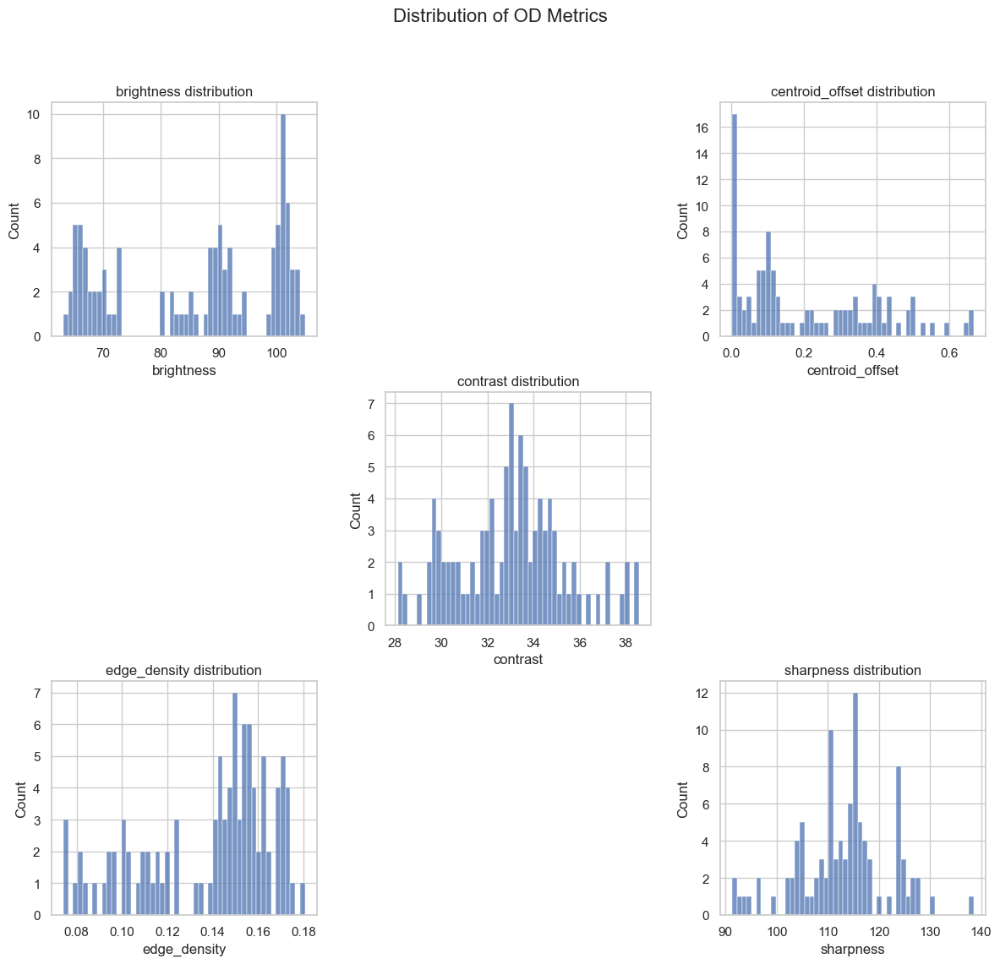

In [89]:
# Ensure seaborn is activate
sns.set(style="whitegrid")

# === TIER FILTER CELL 6: DISTRIBUTION GRID (5 metrics, 3x3 diamond layout) ===
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
fig.suptitle("Distribution of OD Metrics", fontsize=16)

# Flatten axes for easy indexing
axes = axes.flatten()

# Define metric list in alphabetical order
metric_list = ["brightness", "centroid_offset","contrast", "edge_density", "sharpness"]
# metric_list = ["brightness", "centroid_offset","contrast", "edge_density", "sharpness", "blob_count"]

# Define grid placement for diamond layout (positions in 3x3 grid)
# [0 1 2]
# [3 4 5]
# [6 7 8]
# Plotted metrics at: 0, 2, 4, 6, 8
positions = [0, 2, 4, 6, 8]
# positions = [0, 1, 2, 3, 5, 7]

# Loop through and plot each metric
for idx, (metric, pos) in enumerate(zip(metric_list, positions)):
    ax = axes[pos]
    sns.histplot(data=METRIC_STACK_DF, x=metric, bins=50, ax=ax)
    ax.set_title(f"{metric} distribution", fontsize=12)

# Hide unused axes
for i in range(9):
    if i not in positions:
        axes[i].axis("off")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [70]:
# 🔍 Debug Sample Trace — Spot check 10
METRIC_STACK_DF[["blob_count", "brightness", "centroid_offset", "contrast", "edge_density", "sharpness"]].sample(10)

,blob_count,brightness,centroid_offset,contrast,edge_density,sharpness
image_0011.tiff,11,89.889374,0.462240,32.780404,0.147690,110.837112
image_0090.tiff,126,94.205292,0.555719,34.257705,0.141418,122.188095
image_0024.tiff,52,87.360718,0.419792,37.135598,0.143112,111.316437
image_0025.tiff,40,88.978912,0.588068,38.584939,0.142654,110.271871
image_0053.tiff,211,68.021179,0.116329,32.256899,0.102844,111.101598
image_0095.tiff,4,102.146927,0.339844,31.461232,0.157822,116.395925
image_0027.tiff,36,91.635330,0.305804,38.023337,0.151367,115.893758
image_0034.tiff,182,71.669601,0.043791,29.396398,0.118973,102.097773
image_0023.tiff,51,86.150711,0.341947,36.827366,0.144073,111.019414
image_0046.tiff,343,63.158707,0.076202,29.064608,0.092148,103.219208


# FILTER LOGS

In [71]:
# === FILTER LOGS ===
# This section generates a final, consumable log of filtering outcomes.
# It summarizes the pass/fail status of each chip and makes it available for downstream use.

# Assumes `tiered_df` contains a 'reason' column from apply_filter_reason()

# Initialize globals
# FILTERED_METRICS_DF = None
PASS_LIST = None
FAIL_LIST = None
FAIL_DICT = None

# Copy from tiered_df
FILTERED_METRICS_DF = tiered_df.copy()

# --- Resilient tier extraction ---
import ast

def extract_tier(val):
    if isinstance(val, dict):
        return val["tier"]
    try:
        parsed = ast.literal_eval(val)
        return parsed["tier"]
    except:
        return "unknown"

FILTERED_METRICS_DF["tier"] = FILTERED_METRICS_DF["reason"].apply(extract_tier)

# --- Define PASS and FAIL lists ---
PASS_LIST = FILTERED_METRICS_DF[FILTERED_METRICS_DF["tier"] == "pass"].index.tolist()
FAIL_LIST = FILTERED_METRICS_DF[FILTERED_METRICS_DF["tier"] != "pass"].index.tolist()

# --- Build FAIL_DICT from grouped failure reasons ---
from collections import Counter

def extract_reasons(val):
    if isinstance(val, dict):
        return tuple(sorted(val["reasons"]))
    try:
        parsed = ast.literal_eval(val)
        return tuple(sorted(parsed["reasons"]))
    except:
        return ("unknown",)

reason_keys = FILTERED_METRICS_DF[FILTERED_METRICS_DF["tier"] != "pass"]["reason"].apply(extract_reasons)
FAIL_DICT = dict(Counter(reason_keys))

# --- Confirm counts ---
reason_counts = FILTERED_METRICS_DF["reason"].value_counts()
total_excluded = len(FAIL_LIST)
total_images = len(FILTERED_METRICS_DF)

print(reason_counts)
print(f"✅ Total excluded: {total_excluded} / {total_images}")

# --- Promote to globals for downstream use ---
globals()["FILTERED_METRICS_DF"] = FILTERED_METRICS_DF
globals()["PASS_LIST"] = PASS_LIST
globals()["FAIL_LIST"] = FAIL_LIST
globals()["FAIL_DICT"] = FAIL_DICT

reason
{'tier': 'weak', 'reasons': ['low_centroid_offset']}                                                          20
{'tier': 'pass', 'reasons': []}                                                                               18
{'tier': 'weak', 'reasons': ['low_blob_count', 'low_centroid_offset']}                                        18
{'tier': 'fail', 'reasons': ['low_brightness', 'low_centroid_offset', 'low_edge_density']}                    12
{'tier': 'weak', 'reasons': ['low_brightness', 'low_centroid_offset']}                                        11
{'tier': 'weak', 'reasons': ['low_blob_count']}                                                                8
{'tier': 'fail', 'reasons': ['low_brightness', 'low_centroid_offset', 'low_contrast']}                         8
{'tier': 'fail', 'reasons': ['low_blob_count', 'low_centroid_offset', 'low_contrast']}                         4
{'tier': 'fail', 'reasons': ['low_brightness', 'low_centroid_offset', 'low_contrast', 'lo

# FAILURE TYPE ANALYSIS

In [72]:
# === FAILURE TYPE ANALYSIS ===

def generate_placeholder_image(size=(256, 256), text="Image Not Available"):
    """Generate a placeholder image for missing tiles."""
    na_img = Image.new('RGB', size, color='black')
    draw = ImageDraw.Draw(na_img)
    font = ImageFont.load_default()
    w, h = draw.textsize(text, font)
    x = (size[0] - w) // 2
    y = (size[1] - h) // 2
    draw.text((x, y), text, font=font, fill=(255, 255, 255))
    return na_img


def visualize_failure_samples(metric_df, reason_key, image_dir, n_grid=2):
    """
    Visualizes a square grid of chips associated with a specific reason_key.

    - metric_df: FILTERED_METRICS_DF
    - reason_key: string from 'reason' column
    - image_dir: directory of image files
    - n_grid: layout size (2 = 2x2 grid, 3 = 3x3, etc.)
    """
    if "filename" not in metric_df.columns:
        metric_df["filename"] = metric_df.index

    # Match rows that include all elements in reason_key
    reason_parts = reason_key.split(" | ")
    subset = metric_df[metric_df["reason"].apply(
        lambda x: all(r in x.get("reasons", []) for r in reason_parts)
    )].head(n_grid ** 2)

    if subset.empty:
        print(f"[WARNING] No matches found for reason_key: '{reason_key}'")
        return

    fig, axs = plt.subplots(n_grid, n_grid, figsize=(n_grid * 3, n_grid * 3))
    axs = axs.flatten()
    fig.suptitle(f"Failure Reason: {reason_key}", fontsize=14)

    for i, (_, row) in enumerate(subset.iterrows()):
        try:
            img_path = Path(image_dir) / row["filename"]
            img = Image.open(img_path).convert("L")
        except Exception:
            img = generate_placeholder_image()

        axs[i].imshow(img, cmap="gray")
        axs[i].axis("off")
        axs[i].set_title(f"{row['filename']}", fontsize=7)

    # Fill remaining grid spots with placeholders if needed
    for j in range(i + 1, len(axs)):
        axs[j].imshow(generate_placeholder_image(), cmap="gray")
        axs[j].axis("off")

    plt.tight_layout()
    plt.show()


In [73]:
# === FAILURE MODE DISPATCH ===
FAILURE_MODES = {
    1: "low_blob_count",
    2: "low_blob_count | low_sharpness",
    3: "low_blob_count | low_contrast | low_sharpness",
    4: "low_blob_count | low_centroid_offset",
    5: "low_blob_count | low_brightness",
    6: "low_blob_count | low_centroid_offset | low_sharpness",
    7: "low_edge_density | low_sharpness",
    8: "low_blob_count | low_brightness | low_contrast",
    9: "low_blob_count | low_centroid_offset | low_contrast | low_sharpness",
    10: "low_blob_count | low_brightness | low_centroid_offset",
    11: "low_blob_count | low_brightness | low_centroid_offset | low_sharpness",
    12: "low_blob_count | low_brightness | low_centroid_offset | low_contrast",
    13: "low_blob_count | low_brightness | low_centroid_offset | low_contrast | low_sharpness",
    14: "low_brightness | low_centroid_offset | low_contrast | low_sharpness"
}

def get_failures(index: int) -> str:
    return FAILURE_MODES.get(index, "[INVALID INDEX] Select 1–14")

In [74]:
# Example: Visualize failure mode 6
failure_mode = 6
reason_key = get_failures(failure_mode)

visualize_failure_samples(
    metric_df=FILTERED_METRICS_DF,
    reason_key=reason_key,
    image_dir=MY_IMAGE_DIR,
    n_grid=4
)


[WARNING] No matches found for reason_key: 'low_blob_count | low_centroid_offset | low_sharpness'


# FILTERED METRIC EXPORT

In [75]:
# EXPORT: Save filtered metrics for external visualization (e.g., pairplot)
filtered_metric_json_output_dir = "exports"
filtered_metric_json_output_file = "filtered_metrics.json"
filtered_metric_json_output_path = os.path.join(filtered_metric_json_output_dir, filtered_metric_json_output_file)
FILTERED_METRICS_DF.to_json(filtered_metric_json_output_path, orient="records", indent=2)
print("✅ Exported: filtered_metrics.json")


✅ Exported: filtered_metrics.json


# PAIRPLOT

In [76]:
# Load the metrics data
df = pd.read_json(filtered_metric_json_output_path)
df.head()

,blob_count,brightness,centroid_offset,contrast,edge_density,sharpness,flag_low_blob_count,flag_low_brightness,flag_low_centroid_offset,flag_low_contrast,flag_low_edge_density,flag_low_sharpness,reason,quality_tier,tier,filename
0,6,92.117493,0.437500,33.403991,0.164062,116.533279,True,False,False,False,False,False,"{'tier': 'weak', 'reasons': ['low_blob_count']}",weak,weak,image_0000.tiff
1,9,90.889465,0.407552,32.763502,0.160706,115.728338,True,False,False,False,False,False,"{'tier': 'weak', 'reasons': ['low_blob_count']}",weak,weak,image_0001.tiff
2,17,90.672958,0.495536,33.098506,0.159698,114.995010,False,False,False,False,False,False,"{'tier': 'pass', 'reasons': []}",pass,pass,image_0002.tiff
3,17,90.236679,0.429688,33.358577,0.161804,118.027130,False,False,False,False,False,False,"{'tier': 'pass', 'reasons': []}",pass,pass,image_0003.tiff
4,16,90.615845,0.493652,33.661873,0.159225,117.057103,False,False,False,False,False,False,"{'tier': 'pass', 'reasons': []}",pass,pass,image_0004.tiff


In [77]:
metric_cols = ["sharpness", "brightness", "contrast", "edge_density", "centroid_offset"]

In [78]:
def extract_main_reason(reason_dict):
    priority = [
        "low_sharpness", "low_contrast", "low_brightness",
        "low_edge_density", "low_centroid_offset"
    ]
    if isinstance(reason_dict, dict):
        for r in priority:
            if r in reason_dict.get("reasons", []):
                return r
    return None  # not unknown, just silently null
df["main_reason"] = df["reason"].apply(extract_main_reason)
df = df[df["main_reason"].notnull()]

In [79]:
df.main_reason.unique().tolist()

['low_centroid_offset', 'low_contrast', 'low_brightness']

In [80]:
def hex_to_rgba(hex_color, alpha=1.0):
    hex_color = hex_color.lstrip('#')
    r = int(hex_color[0:2], 16) / 255
    g = int(hex_color[2:4], 16) / 255
    b = int(hex_color[4:6], 16) / 255
    return (r, g, b, alpha)

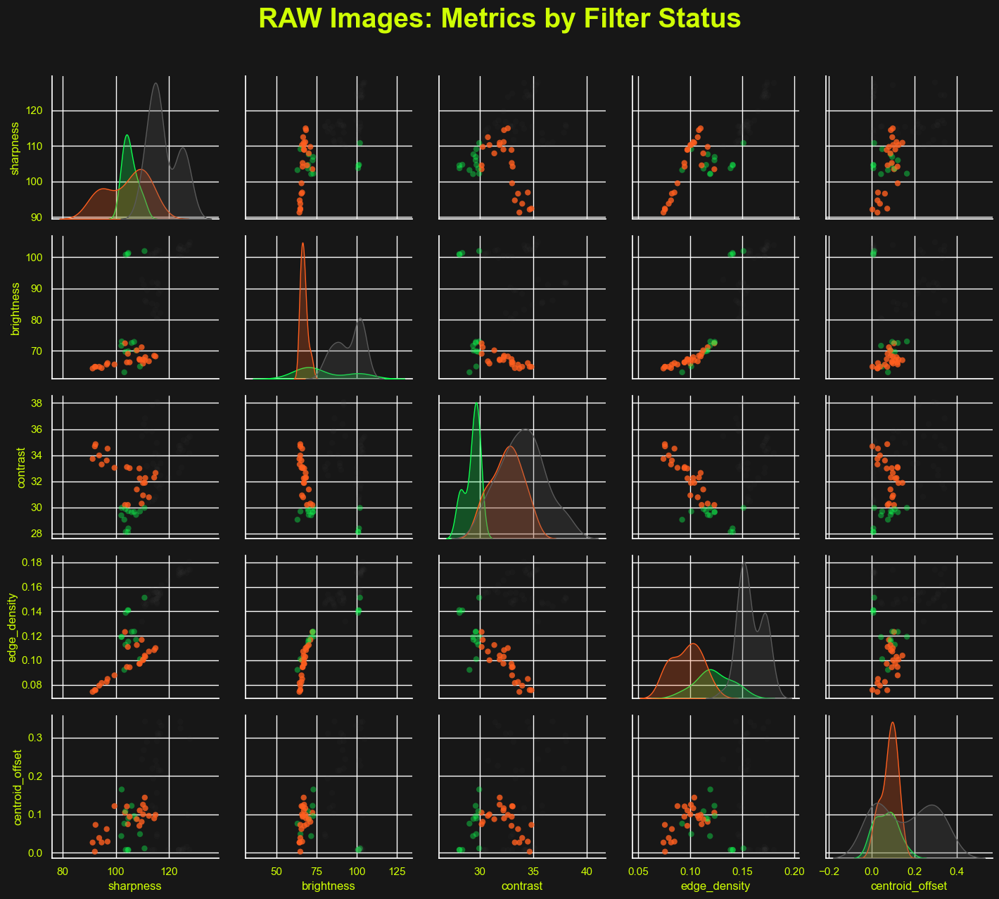

In [81]:
label_color = "#CFFF04"
a_factor=8
palette = {
    'low_centroid_offset': hex_to_rgba("#5A5A5A", alpha=0.0075*a_factor),  # unimportant grey
    'low_edge_density':    hex_to_rgba("#FF3131", alpha=0.05*a_factor),   # neon red
    'low_sharpness':       hex_to_rgba("#1FCCFF", alpha=0.075*a_factor),   # neon blue
    'low_brightness':      hex_to_rgba("#FF5F1F", alpha=0.1*a_factor),   # neon orange
    'low_contrast':        hex_to_rgba("#0FFF50", alpha=0.05*a_factor),   # neon green
}
with plt.style.context('dark_background'):
    bg_color = "#171717"
    # sns.set_style('darkgrid')
    sns.set(rc={'axes.facecolor':bg_color, 'figure.facecolor':bg_color})
    bap = sns.pairplot(df,
                       vars=metric_cols,
                       hue="main_reason",
                       hue_order=list(palette.keys()),
                       palette=palette,
                       plot_kws=dict(edgecolor=None, linewidth=0),  # no edge outlines
                       diag_kind='kde',
                       kind='scatter',
                       corner=False
                       )
    bap._legend.remove()
    plt.suptitle("RAW Images: Metrics by Filter Status", y=1.02,  color=label_color, fontsize=28, fontweight='bold')
    # plt.suptitle("Corrected Images: Metrics by Filter Status", y=1.02,  color=label_color, fontsize=28, fontweight='bold')

    for ax in bap.axes.flatten():
        if ax:
            ax.set_xlabel(ax.get_xlabel(), color=label_color)
            ax.set_ylabel(ax.get_ylabel(), color=label_color)
            ax.tick_params(axis='x', colors=label_color)
            ax.tick_params(axis='y', colors=label_color)

    plt.tight_layout()
    plt.show()

In [82]:
METRIC_STACK_DF.columns.tolist()

['blob_count',
 'brightness',
 'centroid_offset',
 'contrast',
 'edge_density',
 'sharpness']

In [83]:
FILTERED_METRICS_DF.columns.tolist()

['blob_count',
 'brightness',
 'centroid_offset',
 'contrast',
 'edge_density',
 'sharpness',
 'flag_low_blob_count',
 'flag_low_brightness',
 'flag_low_centroid_offset',
 'flag_low_contrast',
 'flag_low_edge_density',
 'flag_low_sharpness',
 'reason',
 'quality_tier',
 'tier',
 'filename']

In [84]:
FILTERED_METRICS_DF['reason']

image_0000.tiff      {'tier': 'weak', 'reasons': ['low_blob_count']}
image_0001.tiff      {'tier': 'weak', 'reasons': ['low_blob_count']}
image_0002.tiff                      {'tier': 'pass', 'reasons': []}
image_0003.tiff                      {'tier': 'pass', 'reasons': []}
image_0004.tiff                      {'tier': 'pass', 'reasons': []}
                                         ...                        
image_0095.tiff    {'tier': 'weak', 'reasons': ['low_blob_count',...
image_0096.tiff      {'tier': 'weak', 'reasons': ['low_blob_count']}
image_0097.tiff    {'tier': 'weak', 'reasons': ['low_centroid_off...
image_0098.tiff                      {'tier': 'pass', 'reasons': []}
image_0099.tiff                      {'tier': 'pass', 'reasons': []}
Name: reason, Length: 100, dtype: object

In [85]:
FILTERED_METRICS_DF['reason'].iloc[2]

{'tier': 'pass', 'reasons': []}

In [86]:
# This shows the fail reasons for all sharp (>150) images that still failed overall.
sharp_but_failed = METRIC_STACK_DF[
    (METRIC_STACK_DF['sharpness'] < 1000) &
    # (FILTERED_METRICS_DF['quality_tier'] == 'fail')
    (FILTERED_METRICS_DF['reason'] == {'tier': 'weak', 'reasons': ['low_sharpness']})
]

print(sharp_but_failed.shape)


(0, 6)


In [87]:
sharp_but_failed.head(10)

,blob_count,brightness,centroid_offset,contrast,edge_density,sharpness


In [88]:
for m in ['sharpness', 'brightness','contrast', 'edge_density', 'centroid_offset']:
    p25,p50,p75 = np.percentile(df[m],[25,50,75])
    print(m, p25, p50, p75)
    print()

sharpness 104.855077107775 111.609375 115.86306889849999

brightness 68.07441711425 83.974861145 100.97791290285001

contrast 30.65595736355 32.9520385345 34.465859497425

edge_density 0.10743331910000001 0.1450424194 0.155197143525

centroid_offset 0.027738186850000002 0.0963309152 0.18652841152500002



# END OF FILE